In [56]:
#importuji prislusne knihovny a stanovuji velikost obrazu

import cv2
import numpy as np
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = [60, 30]

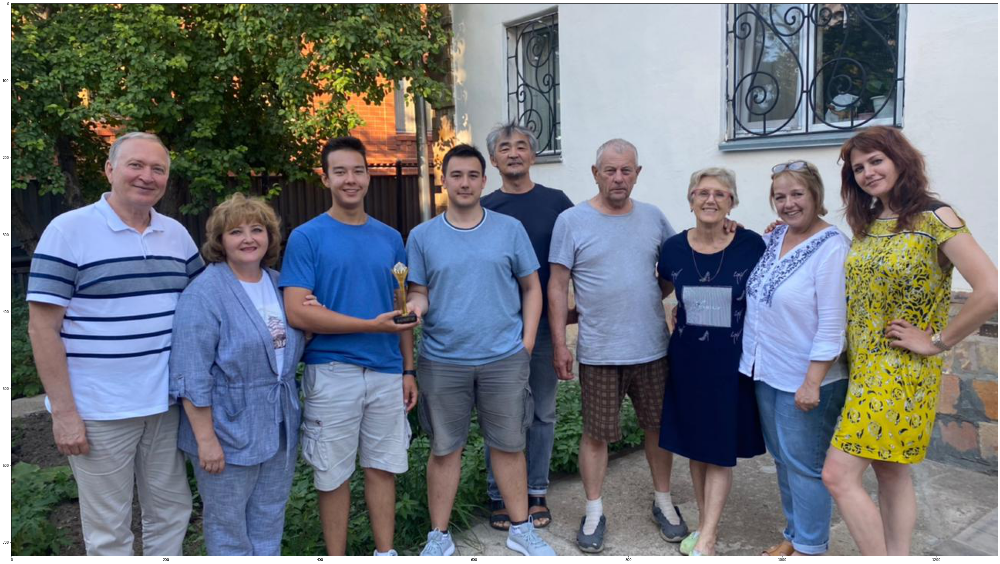

In [81]:
 

img = cv2.imread('melkum.jpeg') #nacitam obrazek,
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) #transformuji bgr na rgb
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) #prevod na sede
plt.imshow(img) #zobrazuji

Number of detected faces: 9
rectangles[[(561, 211) (613, 262)], [(978, 225) (1040, 288)], [(412, 205) (463, 257)], [(763, 205) (815, 257)], [(1091, 193) (1143, 245)], [(625, 170) (677, 222)], [(884, 234) (936, 285)], [(273, 274) (335, 336)], [(126, 176) (215, 265)]]
<bound method PyCapsule.left of rectangle(561,211,613,262)>
561 211 52 51
978 225 62 63
412 205 51 52
763 205 52 52
1091 193 52 52
625 170 52 52
884 234 52 51
273 274 62 62
126 176 89 89


(<matplotlib.image.AxesImage at 0x7f762f180eb0>, Text(0.5, 1.0, 'dlib'))

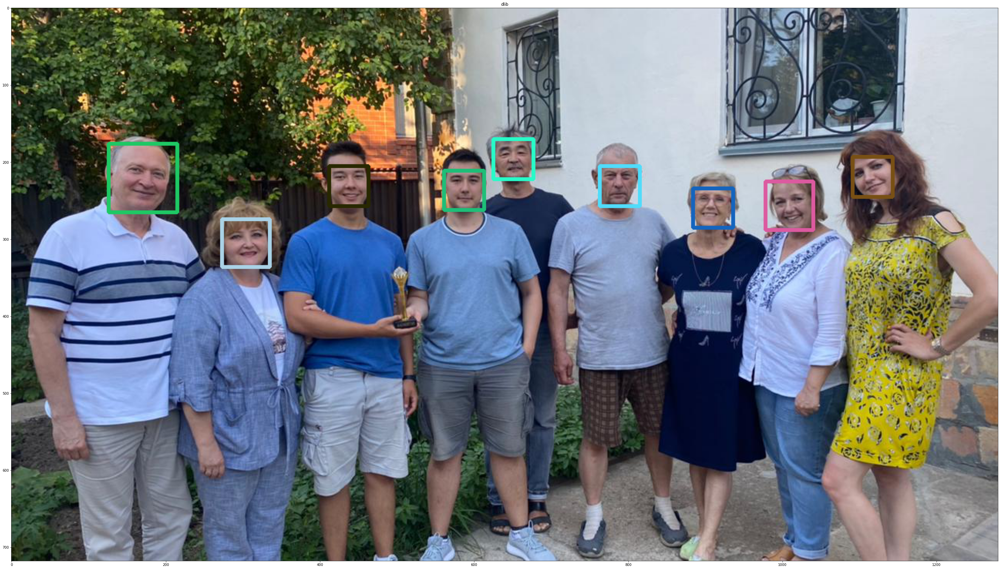

In [82]:
import dlib #importuji pruslusnou knihovnu
import random #importuji knihovnu random 

# Let's load the detector
detector = dlib.get_frontal_face_detector() #DNN detektor
rects = detector(gray, 1) #ukladame detekovane tvare do rects

print('Number of detected faces:', len(rects))
print(rects)
print(rects[0].left)

def rect_to_bb(rect): #funkce kresleni obdelniku kolem detekovanych tvari
    # Dlib rect --> OpenCV rect
    x = rect.left()
    y = rect.top()
    w = rect.right() - x
    h = rect.bottom() - y

    return (x, y, w, h)


# Draw rectangle around each face
result_dlib = np.copy(img) #delame kopii originalniho obrazku
faces_dlib_img = [] #prazdny list 


r = 0
g = 0
b = 0
    
r1 = 0
g1 = 0
b1 = 0

for rect in rects:  #loop kresleni obdelniku ruznych barev
    # Draw rectangle around the face
    x, y, w, h = rect_to_bb(rect)
    print(x, y, w, h)
    
    if r == r1 or g == g1 or b == b1: #podminka na stejne hodnoty RGB
           
        r = random.randrange(0,255,10)
        g = random.randrange(0,255,10)
        b = random.randrange(0,255,10)  

    cv2.rectangle(result_dlib, (x, y), (x+w, y+h), (r, g, b), 3)
    faces_dlib_img.append(img[y:y+h, x:x+w, :])
    
    r1 = r
    g1 = g
    b1 = b
    
    r = random.randrange(0,255,10)
    g = random.randrange(0,255,10)
    b = random.randrange(0,255,10)

plt.imshow(result_dlib), plt.title('dlib')

In [83]:
casc_path = '/home/iliyas/anaconda3/envs/cv/share/opencv4/haarcascades//haarcascade_frontalface_default.xml'
face_cascade = cv2.CascadeClassifier(casc_path)

Number of detected faces: 10


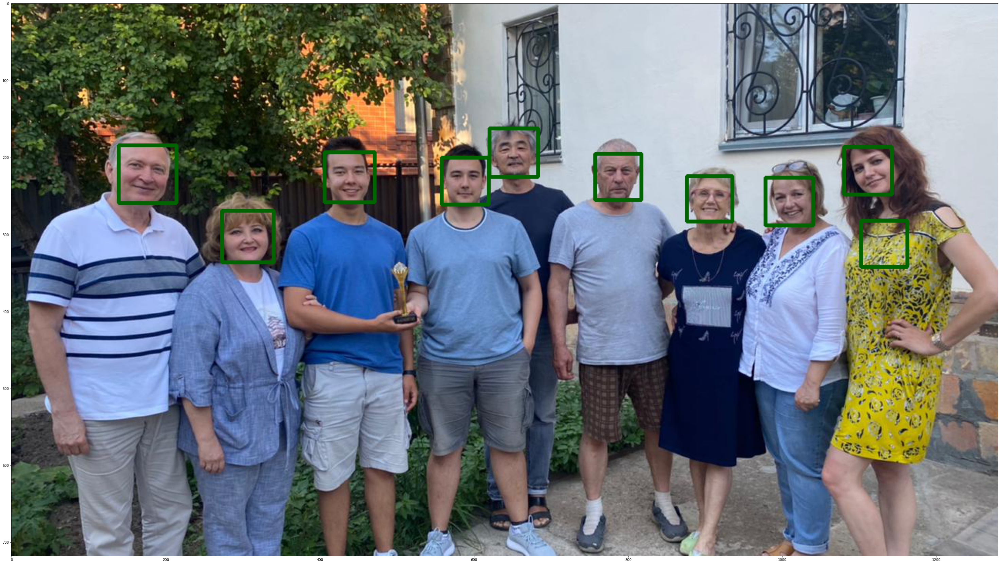

In [84]:
# minNeighbors = 0 shows all the detection at all scale, a value of approx. 5 shall felter out all the spurious detections
faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, flags=cv2.CASCADE_SCALE_IMAGE)

print('Number of detected faces:', len(faces))

# Draw rectangle around each face
result = np.copy(img)
faces_img = []
for (x, y, w, h) in faces: 
    # Draw rectangle around the face
    cv2.rectangle(result, (x, y), (x+w, y+h), (0, 100, 0), 3)
    faces_img.append(img[y:y+h, x:x+w, :])
    
plt.imshow(result)